In [1]:
# Importing necessary libraries

import pandas as pd
import pandas_profiling
import seaborn as sns
import wandb

from matplotlib import pyplot as plt

/tmp/ipykernel_2197447/2025495611.py:4: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


## Initialising the Wights & Bias Run

In [2]:
run = wandb.init(project="nyc_airbnb", group="eda", save_code=True)

wandb: Currently logged in as: rsrinivasevo. Use `wandb login --relogin` to force relogin


> Addinging code also as artifacts, so setting `save_code` to True

In [3]:
# Loading the dataset
data_path = wandb.use_artifact("sample.csv:latest").file()
df = pd.read_csv(data_path, parse_dates=["last_review"])

In [4]:
df.tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
19995,7094539,Tranquil haven in bubbly Brooklyn,2052211,Adriana,Brooklyn,Windsor Terrace,40.65360,-73.97546,Entire home/apt,143,14,2,2016-08-27,0.04,1,10
19996,4424261,Large 1 BR with backyard on UWS,3447311,Sarah,Manhattan,Upper West Side,40.80188,-73.96808,Entire home/apt,200,2,22,2019-05-21,0.50,1,0
19997,4545882,Amazing studio/Loft with a backyard,23569951,Kaveh,Manhattan,Upper East Side,40.78110,-73.94567,Entire home/apt,220,3,28,2019-05-23,0.50,1,293
19998,26518547,U2 comfortable double bed sleeps 2 guests,295128,Carol Gloria,Bronx,Clason Point,40.81225,-73.85502,Private room,80,1,4,2019-07-01,1.48,7,365
19999,33631782,Private Bedroom in Williamsburg Apt!,8569221,Andi,Brooklyn,Williamsburg,40.71829,-73.95819,Private room,109,3,3,2019-04-28,1.07,2,97


In [5]:
df.shape

(20000, 16)

In [6]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
count,2.000000e+04,2.000000e+04,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,15877,15877.000000,20000.000000,20000.000000
mean,1.892380e+07,6.746034e+07,40.728455,-73.952125,153.269050,6.992100,23.274100,2018-10-02 13:13:30.606537728,1.377446,6.955450,112.901200
min,2.539000e+03,2.571000e+03,40.508730,-74.239140,0.000000,1.000000,0.000000,2011-05-12 00:00:00,0.010000,1.000000,0.000000
25%,9.393540e+06,7.853718e+06,40.689420,-73.983030,69.000000,1.000000,1.000000,2018-07-01 00:00:00,0.190000,1.000000,0.000000
50%,1.952117e+07,3.111431e+07,40.722730,-73.955640,105.000000,2.000000,5.000000,2019-05-19 00:00:00,0.720000,1.000000,44.000000
75%,2.912936e+07,1.068426e+08,40.762990,-73.936380,175.000000,5.000000,23.000000,2019-06-23 00:00:00,2.010000,2.000000,229.000000
max,3.648561e+07,2.742733e+08,40.913060,-73.717950,10000.000000,1250.000000,607.000000,2019-07-08 00:00:00,27.950000,327.000000,365.000000
std,1.101223e+07,7.857936e+07,0.054755,0.046559,243.325609,21.645449,44.927793,NaN,1.683006,32.433831,131.762226


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              20000 non-null  int64         
 1   name                            19993 non-null  object        
 2   host_id                         20000 non-null  int64         
 3   host_name                       19992 non-null  object        
 4   neighbourhood_group             20000 non-null  object        
 5   neighbourhood                   20000 non-null  object        
 6   latitude                        20000 non-null  float64       
 7   longitude                       20000 non-null  float64       
 8   room_type                       20000 non-null  object        
 9   price                           20000 non-null  int64         
 10  minimum_nights                  20000 non-null  int64         
 11  nu

In [8]:
# Checking for missing values
df.isna().sum()

id                                   0
name                                 7
host_id                              0
host_name                            8
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       4123
reviews_per_month                 4123
calculated_host_listings_count       0
availability_365                     0
dtype: int64

In [9]:
# Creating a profile report
profile = pandas_profiling.ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

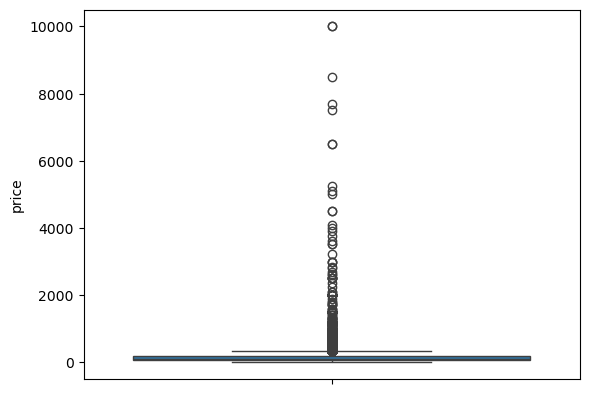

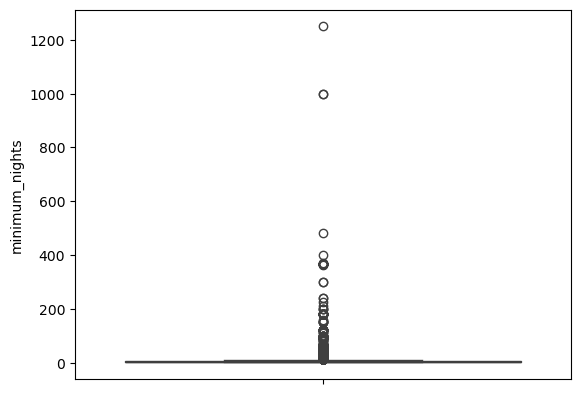

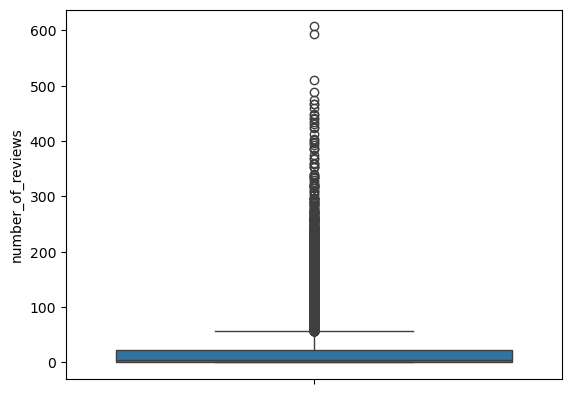

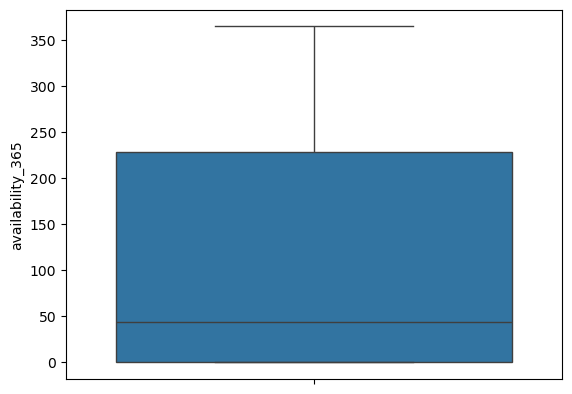

In [11]:
# Plotting boxplots for selected columns

%matplotlib inline

cols = ["price", "minimum_nights", "number_of_reviews", "availability_365"]
for col in cols:
    sns.boxplot(y=df[col])
    plt.show()

In [12]:
# Filtering the dataframe based on price range

min_price = 10
max_price = 350

df = df[df['price'].between(min_price, max_price)].copy()

In [13]:
# Checking for missing values again
df.isna().sum()

id                                   0
name                                 7
host_id                              0
host_name                            8
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       3758
reviews_per_month                 3758
calculated_host_listings_count       0
availability_365                     0
dtype: int64

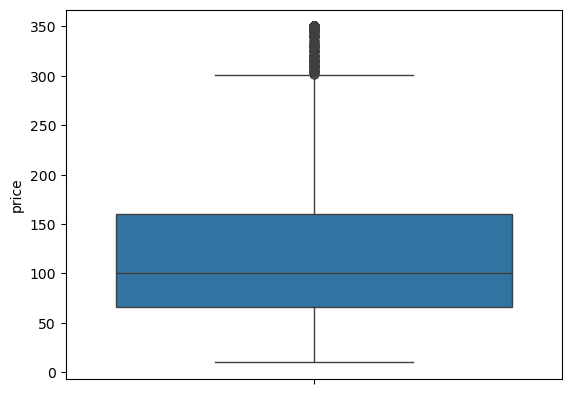

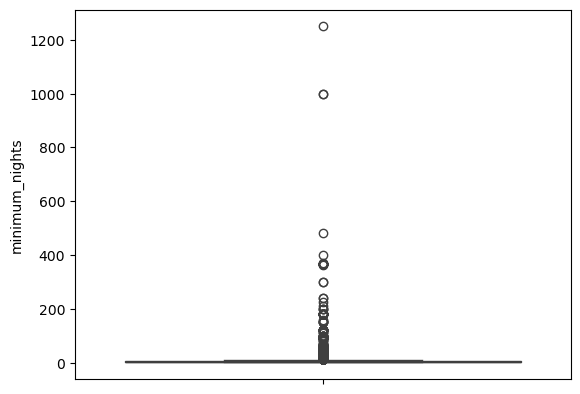

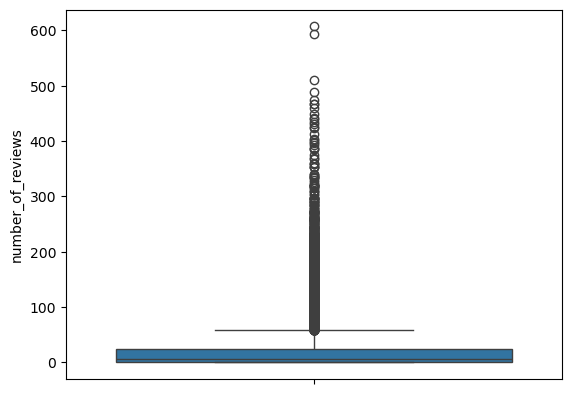

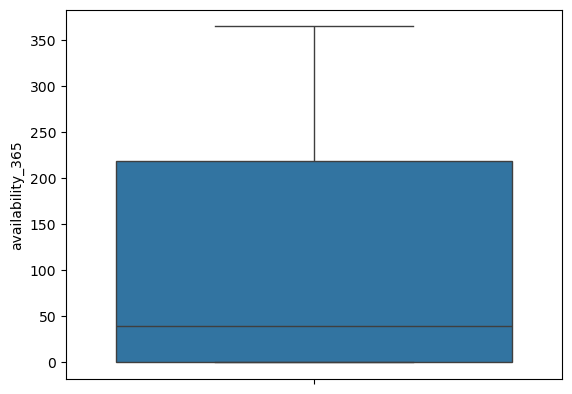

In [14]:
%matplotlib inline

cols = ["price", "minimum_nights", "number_of_reviews", "availability_365"]
for col in cols:
    sns.boxplot(y=df[col])
    plt.show()

> Many outliers still exists might need to handle them before model building so that that they don't distort model performance and reduce accuracy by disproportionately influencing the model's parameters.


In [15]:
run.finish()